In [1]:
import pandas as pd

df = pd.read_csv('Wedding_Planners.csv')
df

,Name,Location,Planning Fee,Type & Demand,Ratings,Reviews
0,Tatva Event Planner,"Baner, Pune","₹2,50,000Onwards",Inhouse & outside decoratorsPlanned in 3 Cities,5.0,(12 reviews)
1,Prayukti Events,Pune,"₹2,00,000Onwards",Inhouse & outside decoratorsUnique Ideas : 17 ...,4.7,(19 reviews)
2,Urban Events,"Kalyani Nagar, Pune","₹2,50,000Onwards",Inhouse & outside decorators,4.9,(16 reviews)
3,Gātha - A Tale of Events,"Koregaon Park, Pune","₹2,00,000Onwards",Inhouse & outside decoratorsValue for money : ...,4.9,(58 reviews)
4,Happy Wedz,"Sinhagad Road, Pune","₹49,999Onwards",Inhouse & outside decoratorsProfessionalism : ...,5.0,(106 reviews)
...,...,...,...,...,...,...
1195,STR Events and Wedding Planners,"Abids, Hyderabad","₹2,00,000Onwards",Inhouse & outside decorators,NaN,No Reviews
1196,RS Media House,Hyderabad,"₹2,00,000Onwards",Inhouse & outside decorators,NaN,No Reviews
1197,Sri Laxmi Balaji Event Planner,"Abids, Hyderabad","₹2,00,000Onwards",Inhouse & outside decorators,NaN,No Reviews
1198,Brindha Events,"Shamshabad, Hyderabad","₹2,00,000Onwards",Inhouse decorators only,NaN,No Reviews


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Name           1200 non-null   object 
 1   Location       1200 non-null   object 
 2   Planning Fee   1200 non-null   object 
 3   Type & Demand  1193 non-null   object 
 4   Ratings        522 non-null    float64
 5   Reviews        1200 non-null   object 
dtypes: float64(1), object(5)
memory usage: 56.4+ KB


In [3]:
df.isna().sum()

Name               0
Location           0
Planning Fee       0
Type & Demand      7
Ratings          678
Reviews            0
dtype: int64

##  Data Cleaning

In [4]:
df['Name'] = df['Name'].str.lower()


In [5]:
# Splitting Location column as location & city

df[['Location', 'City']] = df['Location'].str.split(',', n=1, expand=True)
df['City'] = df['City'].fillna(df['Location'])  # If no city, duplicate to avoid NA
df['Location'] = df['Location'].str.strip().str.lower()  # Remove extra spaces
df['City'] = df['City'].str.strip().str.lower()  # Remove extra spaces


In [6]:
# Clean Planning Fee Field
# Remove ₹ , commas, words -> convert to number

df['Planning Fee'] =(df['Planning Fee'].str.replace("₹", "").str.replace('Onwards','').str.replace(',',''))

In [7]:
df

,Name,Location,Planning Fee,Type & Demand,Ratings,Reviews,City
0,tatva event planner,baner,250000,Inhouse & outside decoratorsPlanned in 3 Cities,5.0,(12 reviews),pune
1,prayukti events,pune,200000,Inhouse & outside decoratorsUnique Ideas : 17 ...,4.7,(19 reviews),pune
2,urban events,kalyani nagar,250000,Inhouse & outside decorators,4.9,(16 reviews),pune
3,gātha - a tale of events,koregaon park,200000,Inhouse & outside decoratorsValue for money : ...,4.9,(58 reviews),pune
4,happy wedz,sinhagad road,49999,Inhouse & outside decoratorsProfessionalism : ...,5.0,(106 reviews),pune
...,...,...,...,...,...,...,...
1195,str events and wedding planners,abids,200000,Inhouse & outside decorators,NaN,No Reviews,hyderabad
1196,rs media house,hyderabad,200000,Inhouse & outside decorators,NaN,No Reviews,hyderabad
1197,sri laxmi balaji event planner,abids,200000,Inhouse & outside decorators,NaN,No Reviews,hyderabad
1198,brindha events,shamshabad,200000,Inhouse decorators only,NaN,No Reviews,hyderabad


In [8]:
df.dtypes

Name              object
Location          object
Planning Fee      object
Type & Demand     object
Ratings          float64
Reviews           object
City              object
dtype: object

In [9]:
# column is in str convert to numeric

df['Planning Fee'] = pd.to_numeric(df['Planning Fee'], errors='coerce').fillna(0)

In [10]:
df.dtypes

Name              object
Location          object
Planning Fee     float64
Type & Demand     object
Ratings          float64
Reviews           object
City              object
dtype: object

In [11]:
# Convert Price Range Into Budget Category
# This is useful for segmentation and visualization

df['Price_category'] = pd.cut(df['Planning Fee'],bins=[0, 50000, 150000, 300000, float('inf')],labels=['Low', 'Medium', 'High', 'Premium']).str.lower()

df['Price_category'] = df['Price_category'].fillna("unknown")

In [12]:
# Renaming the Planning Fee column name
df = df.rename(columns={'Planning Fee': 'Price_onwards'})

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            1200 non-null   object 
 1   Location        1200 non-null   object 
 2   Price_onwards   1200 non-null   float64
 3   Type & Demand   1193 non-null   object 
 4   Ratings         522 non-null    float64
 5   Reviews         1200 non-null   object 
 6   City            1200 non-null   object 
 7   Price_category  1200 non-null   object 
dtypes: float64(2), object(6)
memory usage: 75.1+ KB


In [14]:
# Clean Review Count (convert "123 Reviews" → 123)

df['Reviews'] = (df['Reviews']
.str.replace("reviews", "", case=False)   # remove word 'reviews'
.str.replace("(", "")                     # remove '('
.str.replace(")", "")                     # remove ')'
.str.strip()                              # remove spaces
)

df['Reviews'] = pd.to_numeric(df['Reviews'], errors='coerce').fillna(0).astype(int)

In [15]:
# Clean Review Count (convert "123 Reviews" → 123)
# df['Reviews'] = df['Reviews'].str.extract(r'(\d+)').astype(float)

In [16]:
# df['Reviews'] = df['Reviews'].fillna(0) 

In [17]:
# df['Reviews'] = df['Reviews'].astype(int)

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            1200 non-null   object 
 1   Location        1200 non-null   object 
 2   Price_onwards   1200 non-null   float64
 3   Type & Demand   1193 non-null   object 
 4   Ratings         522 non-null    float64
 5   Reviews         1200 non-null   int64  
 6   City            1200 non-null   object 
 7   Price_category  1200 non-null   object 
dtypes: float64(2), int64(1), object(5)
memory usage: 75.1+ KB


In [19]:
# Renaming the Reviews column name
df = df.rename(columns={'Reviews': 'Review_counts'})

In [20]:
# Extract only the clean phrase from the text

df['Type & Demand'] = df['Type & Demand'].str.extract(r'(Inhouse & outside decorators|Inhouse decorators only)', expand=False).str.lower()

In [21]:
# filling Nan values with mode bcos its categorical column

mode_val = df['Type & Demand'].mode()[0]

In [22]:
df['Type & Demand'] = df['Type & Demand'].fillna(mode_val)

In [23]:
# Rename the column Type & Demand to Decorators type

df= df.rename(columns={'Type & Demand': 'Decorators_type'})

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             1200 non-null   object 
 1   Location         1200 non-null   object 
 2   Price_onwards    1200 non-null   float64
 3   Decorators_type  1200 non-null   object 
 4   Ratings          522 non-null    float64
 5   Review_counts    1200 non-null   int64  
 6   City             1200 non-null   object 
 7   Price_category   1200 non-null   object 
dtypes: float64(2), int64(1), object(5)
memory usage: 75.1+ KB


In [25]:
df.describe()

,Price_onwards,Ratings,Review_counts
count,1.200000e+03,522.000000,1200.000000
mean,2.748375e+05,4.932950,3.603333
std,1.837038e+05,0.126773,11.790752
min,0.000000e+00,4.500000,0.000000
25%,2.000000e+05,4.900000,0.000000
50%,2.000000e+05,5.000000,0.000000
75%,2.500000e+05,5.000000,3.000000
max,4.000000e+06,5.000000,157.000000


In [26]:
# Fill missing values(ie NaN) of Rating column by median

df['Ratings'].fillna(df['Ratings'].median(), inplace=True)

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_5468\852442142.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Ratings'].fillna(df['Ratings'].median(), inplace=True)


In [27]:
df

,Name,Location,Price_onwards,Decorators_type,Ratings,Review_counts,City,Price_category
0,tatva event planner,baner,250000.0,inhouse & outside decorators,5.0,12,pune,high
1,prayukti events,pune,200000.0,inhouse & outside decorators,4.7,19,pune,high
2,urban events,kalyani nagar,250000.0,inhouse & outside decorators,4.9,16,pune,high
3,gātha - a tale of events,koregaon park,200000.0,inhouse & outside decorators,4.9,58,pune,high
4,happy wedz,sinhagad road,49999.0,inhouse & outside decorators,5.0,106,pune,low
...,...,...,...,...,...,...,...,...
1195,str events and wedding planners,abids,200000.0,inhouse & outside decorators,5.0,0,hyderabad,high
1196,rs media house,hyderabad,200000.0,inhouse & outside decorators,5.0,0,hyderabad,high
1197,sri laxmi balaji event planner,abids,200000.0,inhouse & outside decorators,5.0,0,hyderabad,high
1198,brindha events,shamshabad,200000.0,inhouse decorators only,5.0,0,hyderabad,high


In [28]:
df.isna().sum()

Name               0
Location           0
Price_onwards      0
Decorators_type    0
Ratings            0
Review_counts      0
City               0
Price_category     0
dtype: int64

In [29]:
df.to_csv('Wedding_Planners_Cleaned.csv', index = False)

In [30]:
df.to_excel('Wedding.xlsx')

# Analysis

## Dividing wrt to numerical & categorical values

In [31]:
num_df = df[['Price_onwards', 'Ratings', 'Review_counts']]
print(num_df)

      Price_onwards  Ratings  Review_counts
0          250000.0      5.0             12
1          200000.0      4.7             19
2          250000.0      4.9             16
3          200000.0      4.9             58
4           49999.0      5.0            106
...             ...      ...            ...
1195       200000.0      5.0              0
1196       200000.0      5.0              0
1197       200000.0      5.0              0
1198       200000.0      5.0              0
1199       250000.0      5.0              0

[1200 rows x 3 columns]


In [32]:
num_df['Price_onwards'].unique()

array([2.50000e+05, 2.00000e+05, 4.99990e+04, 5.00000e+05, 1.80000e+05,
       4.00000e+05, 3.00000e+05, 0.00000e+00, 1.00000e+05, 6.00000e+05,
       1.20000e+06, 1.50000e+05, 3.50000e+05, 7.00000e+05, 1.00000e+06,
       1.00000e+00, 4.00000e+06, 7.00000e+00, 2.75000e+05, 8.50000e+05,
       5.50000e+05, 4.99970e+04, 1.50000e+06, 2.00000e+00, 5.00000e+04,
       2.99999e+05])

## univariate of num
- histplot
- kde
- Boxplot

In [33]:
# Price_onwards  

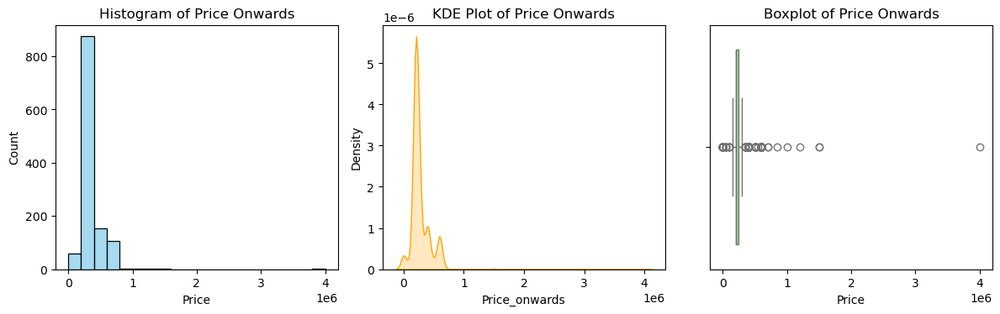

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots — 3 rows, 1 column (for hist, kde, box)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Histogram
sns.histplot(df['Price_onwards'], bins=20, kde=False, color='skyblue', ax=axes[0])
axes[0].set_title('Histogram of Price Onwards')
axes[0].set_xlabel('Price')
axes[0].set_ylabel('Count')

# KDE plot
sns.kdeplot(df['Price_onwards'], fill=True, color='orange', ax=axes[1])
axes[1].set_title('KDE Plot of Price Onwards')
axes[1].set_ylabel('Density')

# Boxplot
sns.boxplot(x=df['Price_onwards'], color='lightgreen', ax=axes[2])
axes[2].set_title('Boxplot of Price Onwards')
axes[2].set_xlabel('Price')

# Adjust spacing
plt.tight_layout()
plt.show()

In [35]:
# Ratings

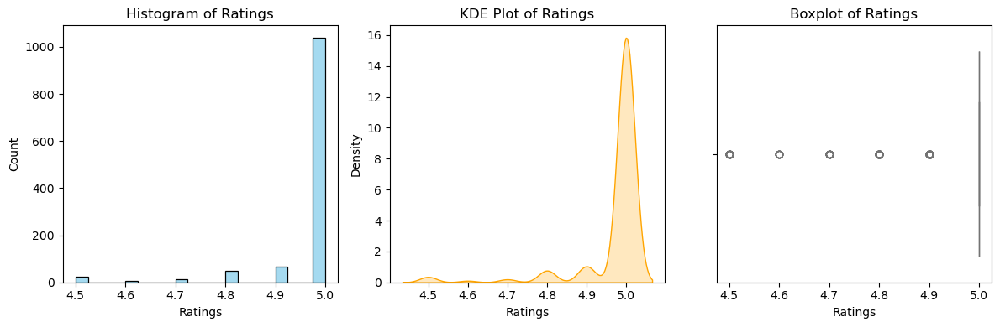

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots — 3 rows, 1 column (for hist, kde, box)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Histogram
sns.histplot(df['Ratings'], bins=20, kde=False, color='skyblue', ax=axes[0])
axes[0].set_title('Histogram of Ratings')
axes[0].set_xlabel('Ratings')
axes[0].set_ylabel('Count')

# KDE plot
sns.kdeplot(df['Ratings'], fill=True, color='orange', ax=axes[1])
axes[1].set_title('KDE Plot of Ratings')
axes[1].set_xlabel('Ratings')
axes[1].set_ylabel('Density')

# Boxplot
sns.boxplot(x=df['Ratings'], color='lightgreen', ax=axes[2])
axes[2].set_title('Boxplot of Ratings')
axes[2].set_xlabel('Ratings')

# Adjust spacing
plt.tight_layout()
plt.show()

In [37]:
# Review_counts

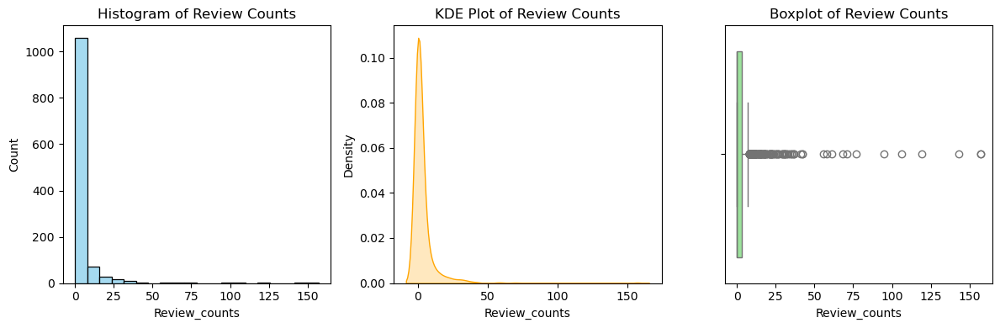

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots — 3 rows, 1 column (for hist, kde, box)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Histogram
sns.histplot(df['Review_counts'], bins=20, kde=False, color='skyblue', ax=axes[0])
axes[0].set_title('Histogram of Review Counts')
axes[0].set_xlabel('Review_counts')
axes[0].set_ylabel('Count')

# KDE plot
sns.kdeplot(df['Review_counts'], fill=True, color='orange', ax=axes[1])
axes[1].set_title('KDE Plot of Review Counts')
axes[1].set_ylabel('Density')

# Boxplot
sns.boxplot(x=df['Review_counts'], color='lightgreen', ax=axes[2])
axes[2].set_title('Boxplot of Review Counts')
axes[2].set_xlabel('Review_counts')

# Adjust spacing
plt.tight_layout()
plt.show()

In [39]:
cat_df = df[['Name', 'Location', 'Decorators_type', 'City', 'Price_category']] 
print(cat_df)

                                 Name       Location  \
0                 tatva event planner          baner   
1                     prayukti events           pune   
2                        urban events  kalyani nagar   
3            gātha - a tale of events  koregaon park   
4                          happy wedz  sinhagad road   
...                               ...            ...   
1195  str events and wedding planners          abids   
1196                   rs media house      hyderabad   
1197   sri laxmi balaji event planner          abids   
1198                   brindha events     shamshabad   
1199                       citi shows      hyderabad   

                   Decorators_type       City Price_category  
0     inhouse & outside decorators       pune           high  
1     inhouse & outside decorators       pune           high  
2     inhouse & outside decorators       pune           high  
3     inhouse & outside decorators       pune           high  
4     inhous

## univariate of cat 
- barplot
- pie
- countplot

In [40]:
# Location   

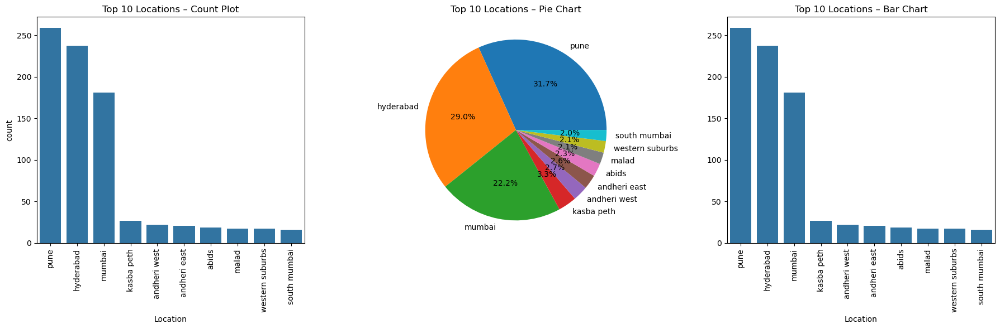

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1️. Get top 10 categories
location_counts = df['Location'].value_counts().head(10)

# 2️. Filter dataframe to only include these top 10 locations
df_top10 = df[df['Location'].isin(location_counts.index)]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 1️. Count Plot (Top 10 only)
sns.countplot(x='Location', data=df_top10, order=location_counts.index, ax=axes[0])
axes[0].set_title('Top 10 Locations – Count Plot')
axes[0].tick_params(axis='x', rotation=90)

# 2️. Pie Chart (Top 10 only)
axes[1].pie(location_counts.values, labels=location_counts.index, autopct='%1.1f%%')
axes[1].set_title('Top 10 Locations – Pie Chart')

# 3️. Bar Plot (Top 10 only)
sns.barplot(x=location_counts.index, y=location_counts.values, ax=axes[2])
axes[2].set_title('Top 10 Locations – Bar Chart')
axes[2].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


In [42]:
# Decorators_type

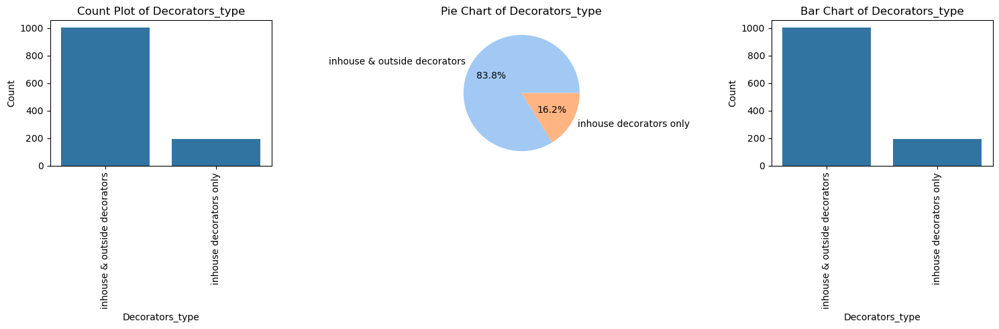

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example: assuming df['Location'] exists
# Count frequencies
Decorators_count = df['Decorators_type'].value_counts()

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 1️. Count Plot
sns.countplot(x='Decorators_type', data=df, ax=axes[0])
axes[0].set_title('Count Plot of Decorators_type')
axes[0].set_xlabel('Decorators_type')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=90)

# 2️. Pie Chart
axes[1].pie(Decorators_count.values, labels=Decorators_count.index, autopct='%1.1f%%', colors=sns.color_palette('pastel'))
axes[1].set_title('Pie Chart of Decorators_type')

# 3️. Bar Plot (sorted)
sns.barplot(x=Decorators_count.index, y=Decorators_count.values, ax=axes[2])
axes[2].set_title('Bar Chart of Decorators_type')
axes[2].set_xlabel('Decorators_type')
axes[2].set_ylabel('Count')
axes[2].tick_params(axis='x', rotation=90)

# Adjust layout
plt.tight_layout()
plt.show()

In [44]:
# City

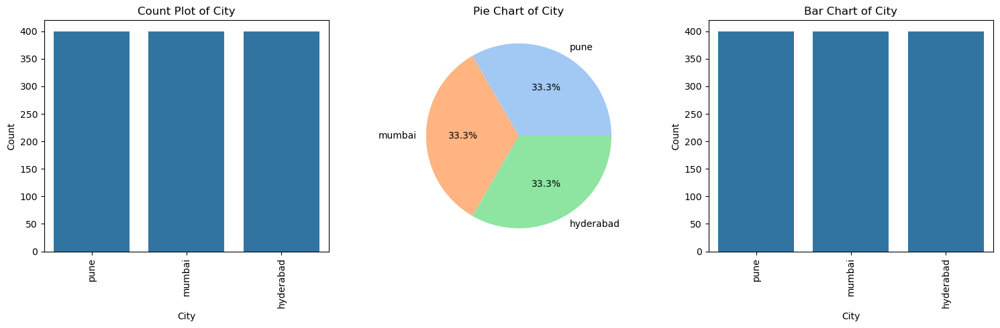

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example: assuming df['Location'] exists
# Count frequencies
City_count = df['City'].value_counts()

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 1️. Count Plot
sns.countplot(x='City', data=df, ax=axes[0])
axes[0].set_title('Count Plot of City')
axes[0].set_xlabel('City')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=90)

# 2️. Pie Chart
axes[1].pie(City_count.values, labels=City_count.index, autopct='%1.1f%%', colors=sns.color_palette('pastel'))
axes[1].set_title('Pie Chart of City')

# 3️. Bar Plot (sorted)
sns.barplot(x=City_count.index, y=City_count.values, ax=axes[2])
axes[2].set_title('Bar Chart of City')
axes[2].set_xlabel('City')
axes[2].set_ylabel('Count')
axes[2].tick_params(axis='x', rotation=90)

# Adjust layout
plt.tight_layout()
plt.show()

In [46]:
# Price_category

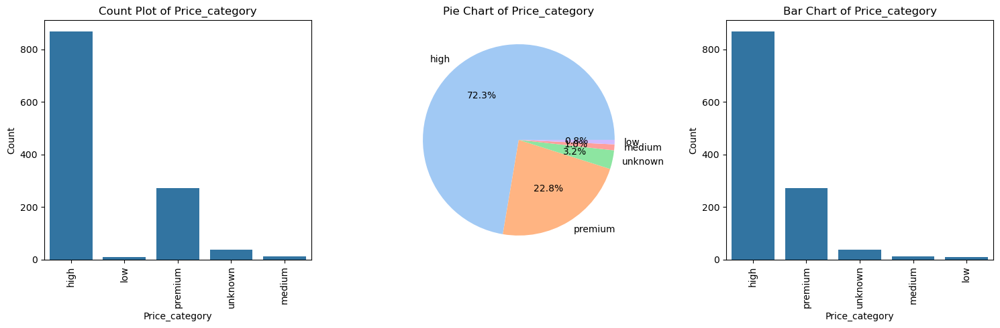

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example: assuming df['Location'] exists
# Count frequencies
Pcat_count = df['Price_category'].value_counts()

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 1️. Count Plot
sns.countplot(x='Price_category', data=df, ax=axes[0])
axes[0].set_title('Count Plot of Price_category')
axes[0].set_xlabel('Price_category')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=90)

# 2️. Pie Chart
axes[1].pie(Pcat_count.values, labels=Pcat_count.index, autopct='%1.1f%%', colors=sns.color_palette('pastel'))
axes[1].set_title('Pie Chart of Price_category')

# 3️. Bar Plot (sorted)
sns.barplot(x=Pcat_count.index, y=Pcat_count.values, ax=axes[2])
axes[2].set_title('Bar Chart of Price_category')
axes[2].set_xlabel('Price_category')
axes[2].set_ylabel('Count')
axes[2].tick_params(axis='x', rotation=90)

# Adjust layout
plt.tight_layout()
plt.show()

# Bivariate Analysis

In [48]:
print(num_df.columns)
print('*'*20)
cat_df.columns

Index(['Price_onwards', 'Ratings', 'Review_counts'], dtype='object')
********************


Index(['Name', 'Location', 'Decorators_type', 'City', 'Price_category'], dtype='object')

In [49]:
#num v/s num scatter,line
#cat v/s cat barplot

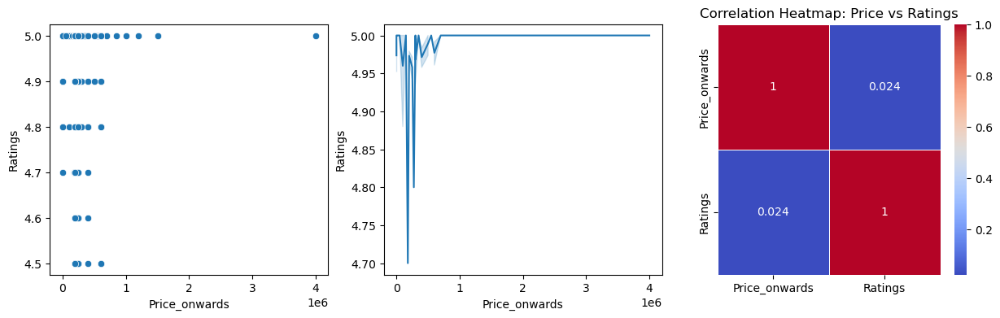

In [50]:
# Price_onwards v/s Ratings

fig, axes = plt.subplots(1,3, figsize=(15,4))

# plt.figure(figsize=(6,4))
sns.scatterplot(x=df['Price_onwards'], y=df['Ratings'], ax=axes[0])
plt.title("Scatterplot: Price_onwards vs Ratings")


# plt.figure(figsize=(6,4))
sns.lineplot(x=df['Price_onwards'], y=df['Ratings'], ax=axes[1])
plt.title("Line Plot")

# Select only the required numeric columns
corr = df[['Price_onwards', 'Ratings']].corr()

# Plot heatmap
# plt.figure(figsize=(6,4))
sns.heatmap(corr, annot=True, linewidths=0.5, cmap='coolwarm')
plt.title("Correlation Heatmap: Price vs Ratings")
plt.show()

How to Interpret?

+1 → Strong positive relation
0 → No relation
–1 → Strong negative relation

Example:
If correlation is 0.30 → higher ratings slightly increase price  
If correlation is near 0 → ratings and price are not related

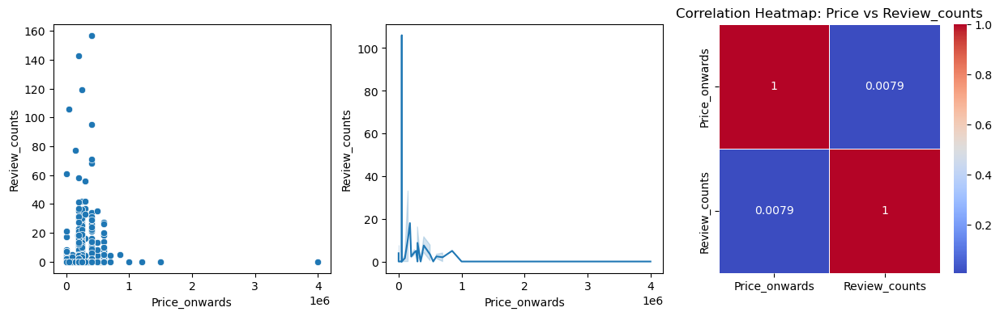

In [51]:
# Price_onwards v/s Review_counts

fig, axes = plt.subplots(1,3, figsize=(15,4))

# Scatter Plot
sns.scatterplot(x=df['Price_onwards'], y=df['Review_counts'], ax=axes[0])
plt.title("Scatterplot: Price_onwards vs Review_counts")

# Line Plot
sns.lineplot(x=df['Price_onwards'], y=df['Review_counts'], ax=axes[1])
plt.title("Line Plot")

# Heatmap
# Select only the required numeric columns
corr = df[['Price_onwards', 'Review_counts']].corr()

# Plot heatmap

sns.heatmap(corr, annot=True, linewidths=0.5, cmap='coolwarm')
plt.title("Correlation Heatmap: Price vs Review_counts")
plt.show()

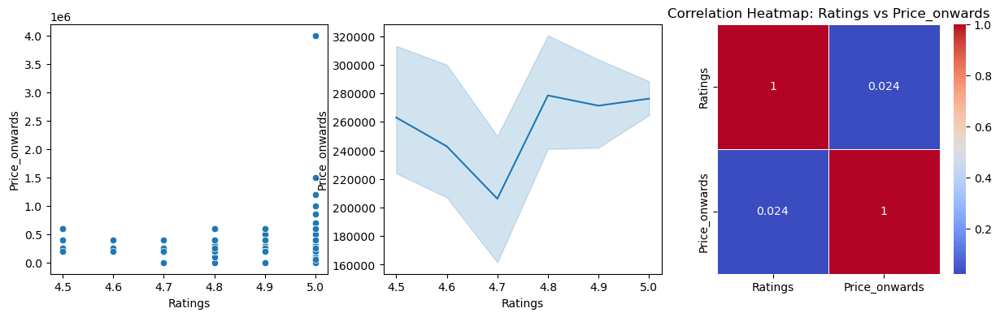

In [52]:
# Ratings v/s Price_onwards

fig, axes = plt.subplots(1,3, figsize=(15,4))

# Scatter Plot
sns.scatterplot(x=df['Ratings'], y=df['Price_onwards'], ax=axes[0])
plt.title("Scatterplot: Ratings vs Price_onwards")

# Line Plot
sns.lineplot(x=df['Ratings'], y=df['Price_onwards'], ax=axes[1])
plt.title("Line Plot")

# Heatmap
# Select only the required numeric columns
corr = df[['Ratings', 'Price_onwards']].corr()

# Plot heatmap

sns.heatmap(corr, annot=True, linewidths=0.5, cmap='coolwarm')
plt.title("Correlation Heatmap: Ratings vs Price_onwards")
plt.show()

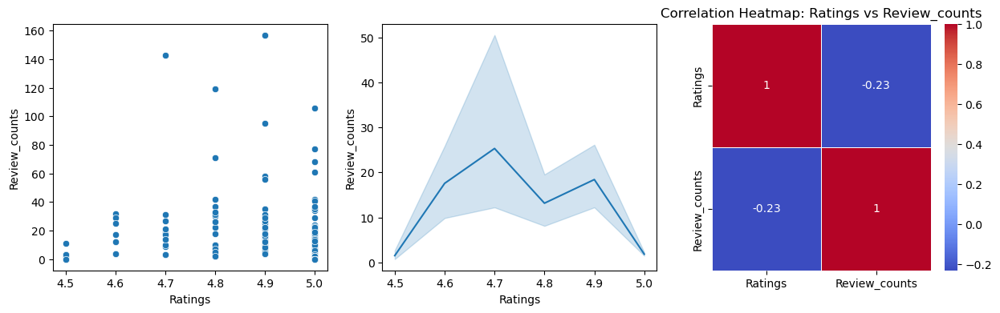

In [53]:
# Ratings v/s Review_counts

fig, axes = plt.subplots(1,3, figsize=(15,4))

# Scatter Plot
sns.scatterplot(x=df['Ratings'], y=df['Review_counts'], ax=axes[0])
plt.title("Scatterplot: Ratings vs Review_counts")

# Line Plot
sns.lineplot(x=df['Ratings'], y=df['Review_counts'], ax=axes[1])
plt.title("Line Plot")

# Heatmap
# Select only the required numeric columns
corr = df[['Ratings', 'Review_counts']].corr()

# Plot heatmap

sns.heatmap(corr, annot=True, linewidths=0.5, cmap='coolwarm')
plt.title("Correlation Heatmap: Ratings vs Review_counts")
plt.show()

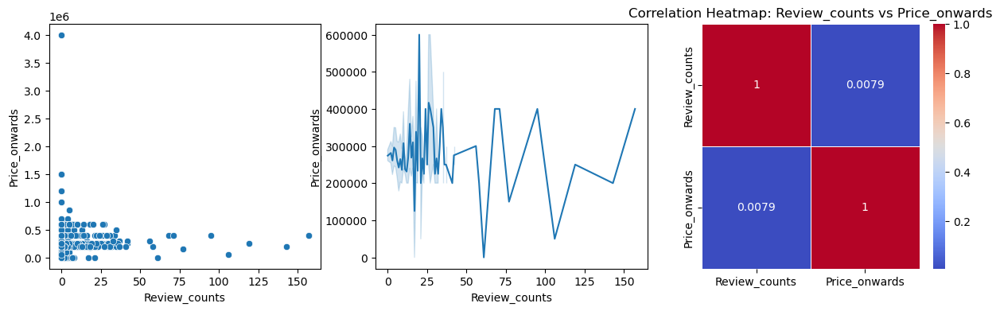

In [54]:
# Review_counts v/s Price_onwards

fig, axes = plt.subplots(1,3, figsize=(15,4))

# Scatter Plot
sns.scatterplot(x=df['Review_counts'], y=df['Price_onwards'], ax=axes[0])
plt.title("Scatterplot: Review_counts vs Price_onwards")

# Line Plot
sns.lineplot(x=df['Review_counts'], y=df['Price_onwards'], ax=axes[1])
plt.title("Line Plot")

# Heatmap
# Select only the required numeric columns
corr = df[['Review_counts', 'Price_onwards']].corr()

# Plot heatmap

sns.heatmap(corr, annot=True, linewidths=0.5, cmap='coolwarm')
plt.title("Correlation Heatmap: Review_counts vs Price_onwards")
plt.show()

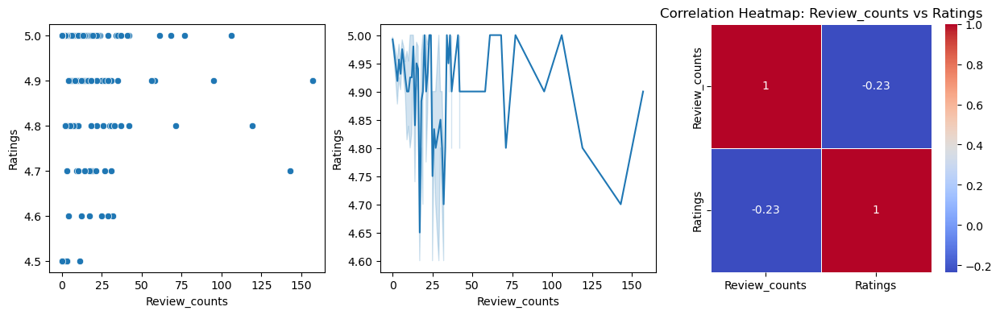

In [55]:
# Review_counts v/s Ratings

fig, axes = plt.subplots(1,3, figsize=(15,4))

# plt.figure(figsize=(6,4))
sns.scatterplot(x=df['Review_counts'], y=df['Ratings'], ax=axes[0])
plt.title("Scatterplot: Review_counts vs Ratings")


# plt.figure(figsize=(6,4))
sns.lineplot(x=df['Review_counts'], y=df['Ratings'], ax=axes[1])
plt.title("Line Plot")

# Select only the required numeric columns
corr = df[['Review_counts', 'Ratings']].corr()

# Plot heatmap
# plt.figure(figsize=(6,4))
sns.heatmap(corr, annot=True, linewidths=0.5, cmap='coolwarm')
plt.title("Correlation Heatmap: Review_counts vs Ratings")
plt.show()

# Cat vs Cat

In [56]:
cat_df.columns

Index(['Name', 'Location', 'Decorators_type', 'City', 'Price_category'], dtype='object')

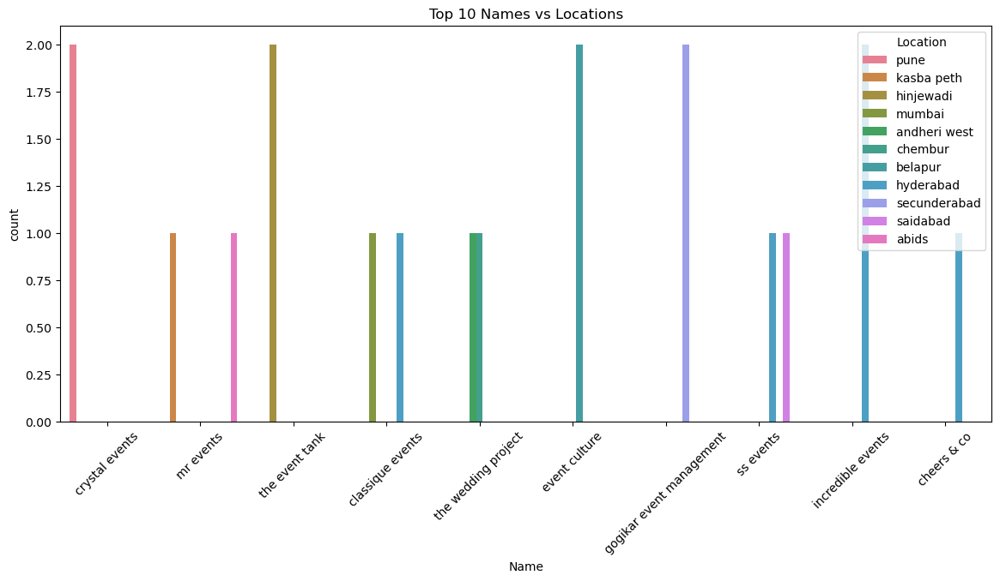

In [57]:
# Filter top 10 name vs Location
top10_names = df['Name'].value_counts().head(10).index
df_top_names = df[df['Name'].isin(top10_names)]

plt.figure(figsize=(14,6))
sns.countplot(x='Name', hue='Location', data=df_top_names)
plt.title("Top 10 Names vs Locations")
plt.xticks(rotation=45)
plt.show()


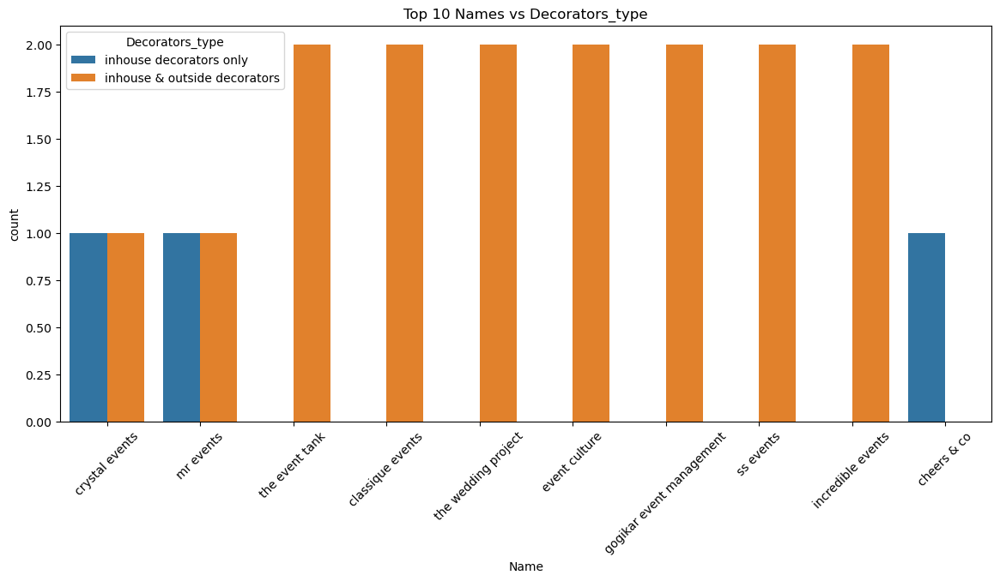

In [58]:
# Filter top 10 name vs Decorators_type
top10_names = df['Name'].value_counts().head(10).index
df_top_names = df[df['Name'].isin(top10_names)]

plt.figure(figsize=(14,6))
sns.countplot(x='Name', hue='Decorators_type', data=df_top_names)
plt.title("Top 10 Names vs Decorators_type")
plt.xticks(rotation=45)
plt.show()


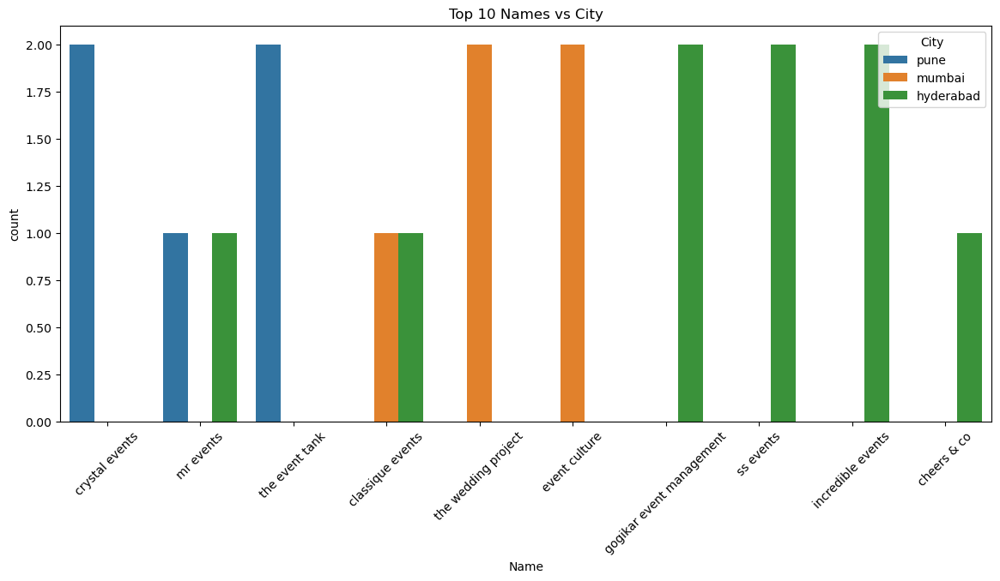

In [59]:
# Filter top 10 name vs City
top10_names = df['Name'].value_counts().head(10).index
df_top_names = df[df['Name'].isin(top10_names)]

plt.figure(figsize=(14,6))
sns.countplot(x='Name', hue='City', data=df_top_names)
plt.title("Top 10 Names vs City")
plt.xticks(rotation=45)
plt.show()


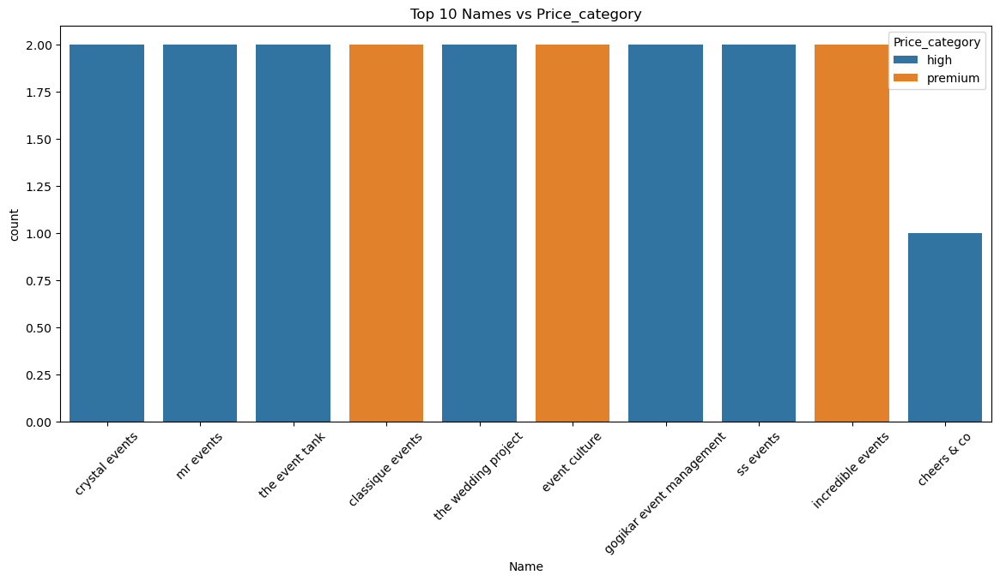

In [60]:
# Filter top 10 name vs Price_category
top10_names = df['Name'].value_counts().head(10).index
df_top_names = df[df['Name'].isin(top10_names)]

plt.figure(figsize=(14,6))
sns.countplot(x='Name', hue='Price_category', data=df_top_names)
plt.title("Top 10 Names vs Price_category"
plt.xticks(rotation=45)
plt.show()


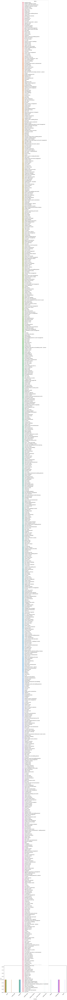

In [74]:
# Filter top 10 Location vs name 
Location = df['Location'].value_counts().head(10).index
df_location = df[df['Location'].isin(Location)]

plt.figure(figsize=(14,6))
sns.countplot(x='Location', hue='Name', data=df_location)
plt.title("Top 10 Locations vs Name")
plt.xticks(rotation=45)
plt.show()


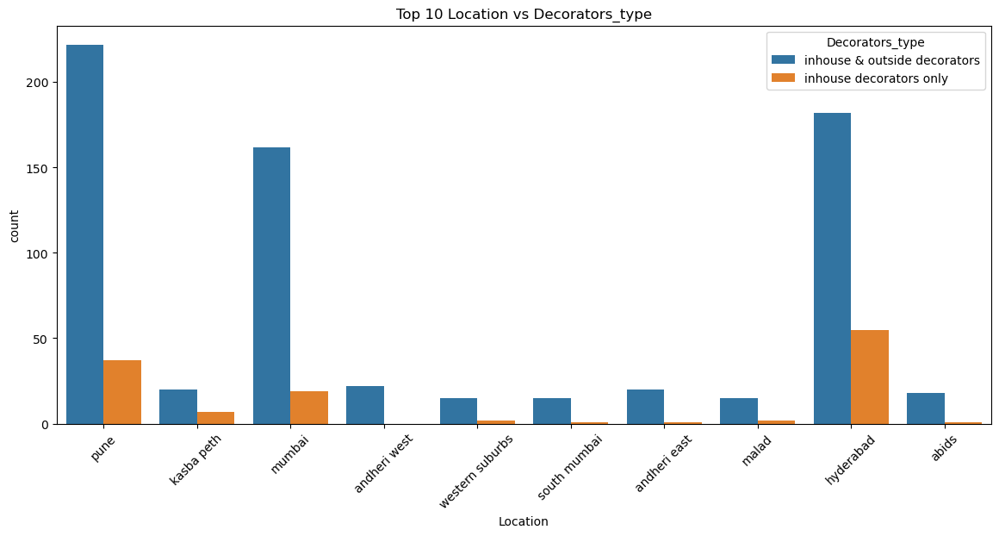

In [75]:
# Filter top 10 Location vs Decorators_type
top10_loca = df['Location'].value_counts().head(10).index
df_top_loca = df[df['Location'].isin(top10_loca)]

plt.figure(figsize=(14,6))
sns.countplot(x='Location', hue='Decorators_type', data=df_top_names)
plt.title("Top 10 Location vs Decorators_type")
plt.xticks(rotation=45)
plt.show()


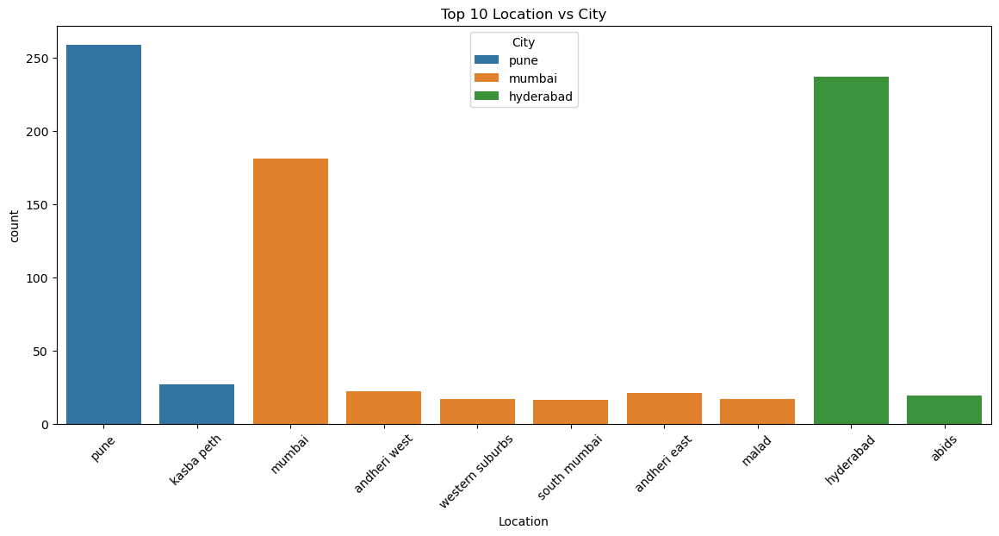

In [70]:
# Filter top 10 Location vs City
top10_names = df['Location'].value_counts().head(10).index
df_top_names = df[df['Location'].isin(top10_names)]

plt.figure(figsize=(14,6))
sns.countplot(x='Location', hue='City', data=df_top_names)
plt.title("Top 10 Location vs City")
plt.xticks(rotation=45)
plt.show()


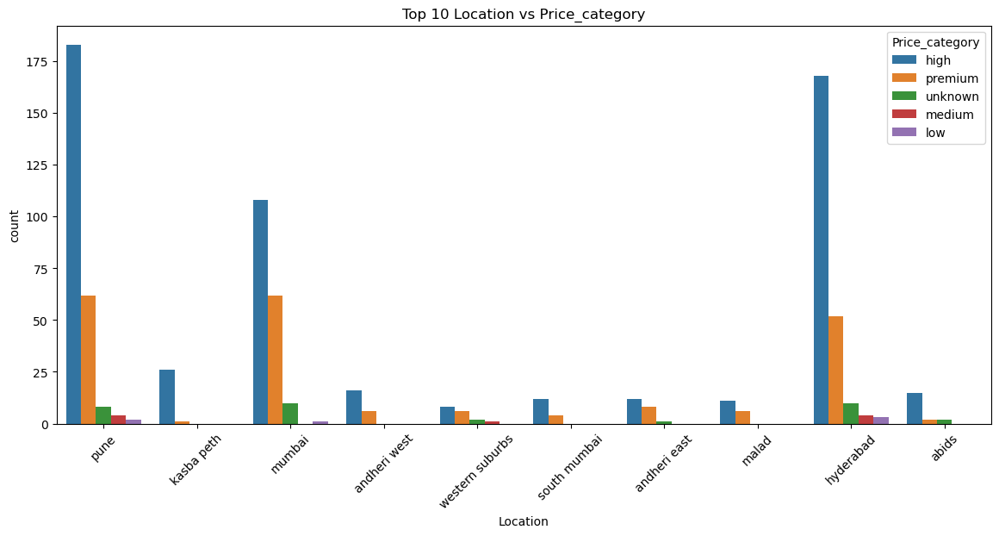

In [76]:
# Filter top 10 Location vs Price_category
top10_loca = df['Location'].value_counts().head(10).index
df_top_loca = df[df['Location'].isin(top10_loca)]

plt.figure(figsize=(14,6))
sns.countplot(x='Location', hue='Price_category', data=df_top_loca)
plt.title("Top 10 Location vs Price_category")
plt.xticks(rotation=45)
plt.show()


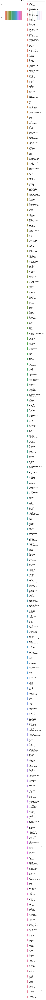

In [77]:
# Filter top 10 Decoration_type vs name 
deco = df['Decorators_type'].value_counts().head(10).index
df_deco = df[df['Decorators_type'].isin(deco)]

plt.figure(figsize=(14,6))
sns.countplot(x='Decorators_type', hue='Name', data=df_deco)
plt.title("Top 10 Decorators_type vs Name")
plt.xticks(rotation=45)
plt.show()


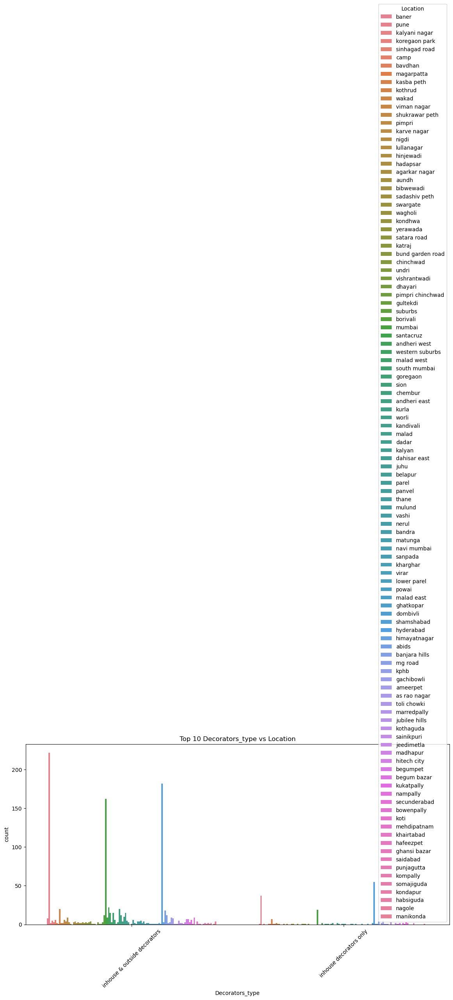

In [78]:
# Filter top 10 Decorators_type vs Location 
deco = df['Decorators_type'].value_counts().head(10).index
df_deco = df[df['Decorators_type'].isin(deco)]

plt.figure(figsize=(14,6))
sns.countplot(x='Decorators_type', hue='Location', data=df_deco)
plt.title("Top 10 Decorators_type vs Location")
plt.xticks(rotation=45)
plt.show()


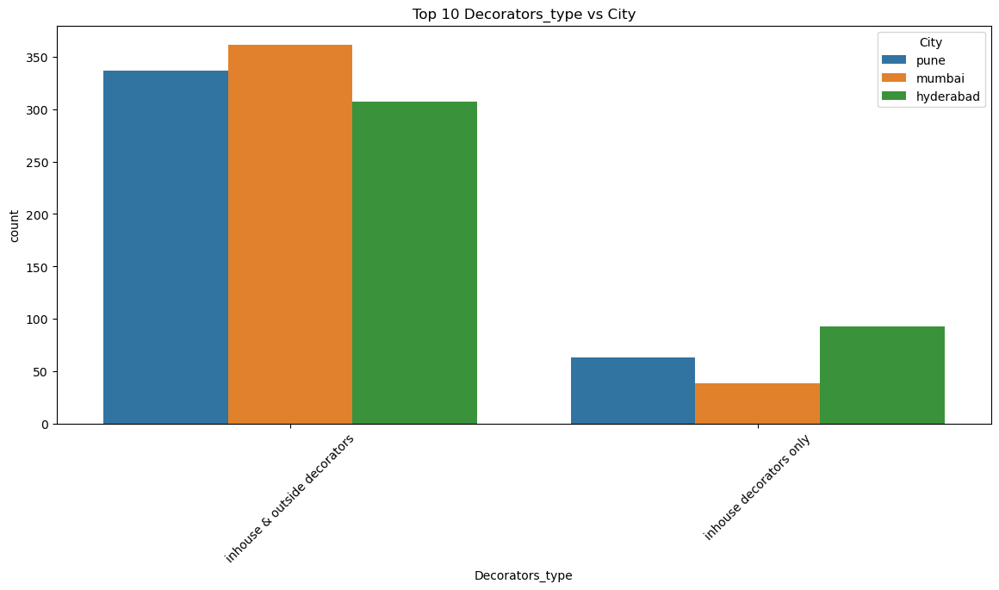

In [79]:
# Filter top 10 Decorators_type vs City 
deco = df['Decorators_type'].value_counts().head(10).index
df_deco = df[df['Decorators_type'].isin(deco)]

plt.figure(figsize=(14,6))
sns.countplot(x='Decorators_type', hue='City', data=df_deco)
plt.title("Top 10 Decorators_type vs City")
plt.xticks(rotation=45)
plt.show()


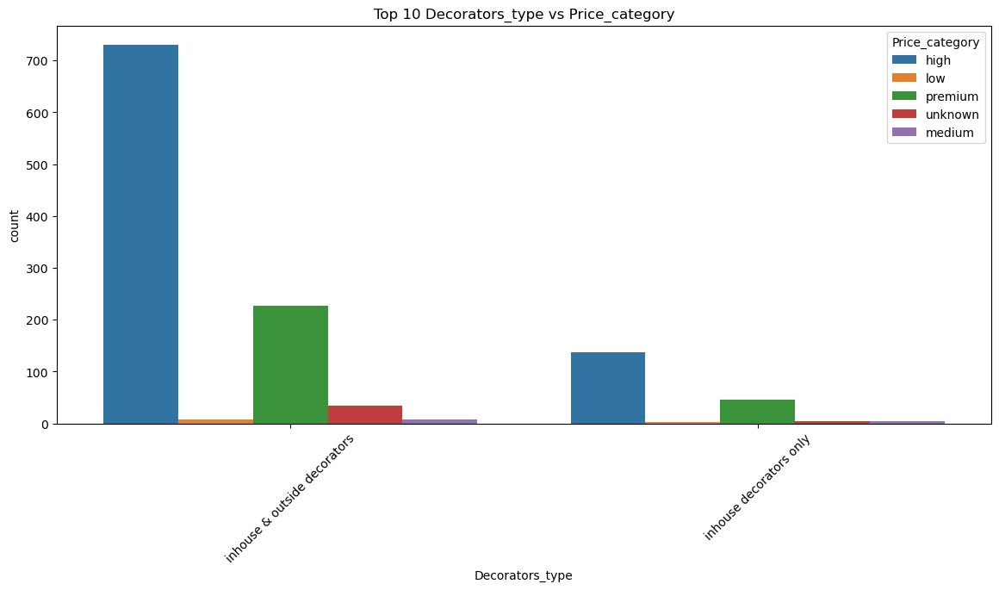

In [80]:
# Filter top 10 Decorators_type vs Price_category 
deco = df['Decorators_type'].value_counts().head(10).index
df_deco = df[df['Decorators_type'].isin(deco)]

plt.figure(figsize=(14,6))
sns.countplot(x='Decorators_type', hue='Price_category', data=df_deco)
plt.title("Top 10 Decorators_type vs Price_category")
plt.xticks(rotation=45)
plt.show()


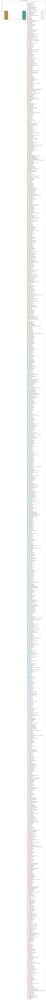

In [81]:
# Filter top 10 City vs Name
city = df['City'].value_counts().head(10).index
df_city = df[df['City'].isin(city)]

plt.figure(figsize=(14,6))
sns.countplot(x='City', hue='Name', data=df_city)
plt.title("Top 10 City vs Name")
plt.xticks(rotation=45)
plt.show()


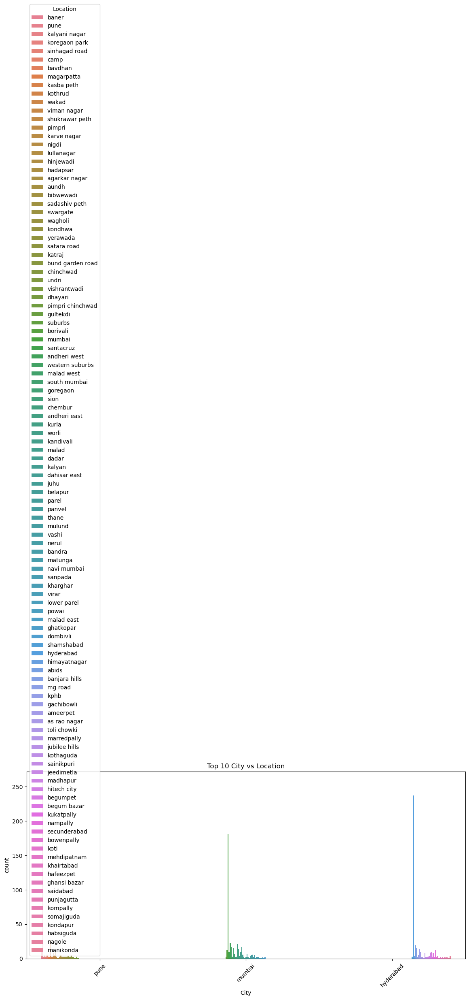

In [82]:
# Filter top 10 City vs Location
city = df['City'].value_counts().head(10).index
df_city = df[df['City'].isin(city)]

plt.figure(figsize=(14,6))
sns.countplot(x='City', hue='Location', data=df_city)
plt.title("Top 10 City vs Location")
plt.xticks(rotation=45)
plt.show()


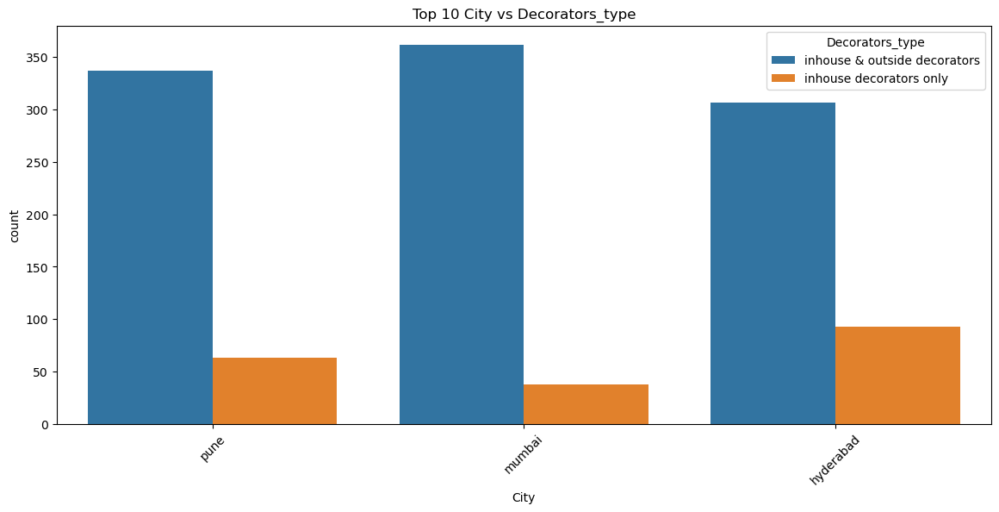

In [83]:
# Filter top 10 City vs Decorators_type
city = df['City'].value_counts().head(10).index
df_city = df[df['City'].isin(city)]

plt.figure(figsize=(14,6))
sns.countplot(x='City', hue='Decorators_type', data=df_city)
plt.title("Top 10 City vs Decorators_type")
plt.xticks(rotation=45)
plt.show()


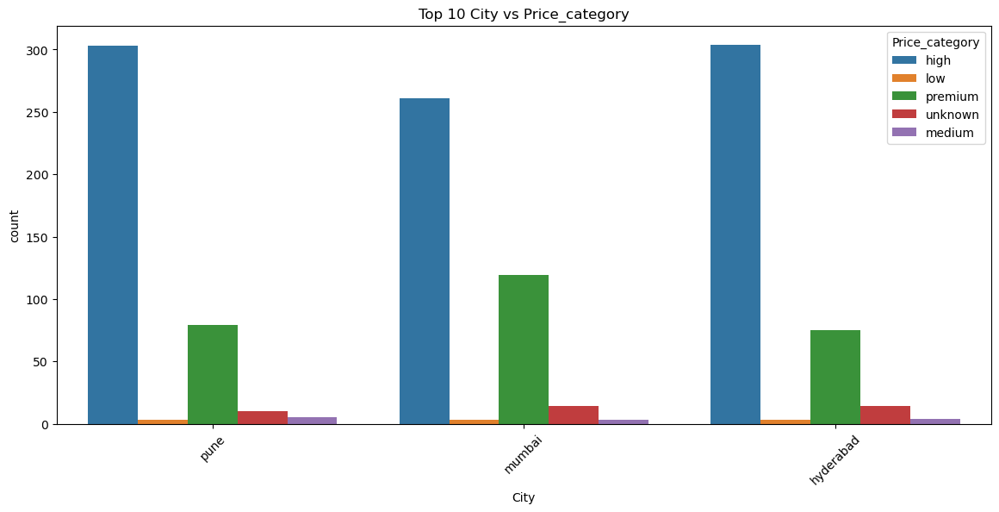

In [84]:
# Filter top 10 City vs Price_category
city = df['City'].value_counts().head(10).index
df_city = df[df['City'].isin(city)]

plt.figure(figsize=(14,6))
sns.countplot(x='City', hue='Price_category', data=df_city)
plt.title("Top 10 City vs Price_category")
plt.xticks(rotation=45)
plt.show()


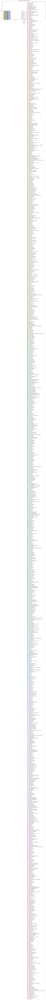

In [85]:
# Filter top 10 Price_category vs Name
price = df['Price_category'].value_counts().head(10).index
df_price = df[df['Price_category'].isin(price)]

plt.figure(figsize=(14,6))
sns.countplot(x='Price_category', hue='Name', data=df_price)
plt.title("Top 10 Price_category vs Name")
plt.xticks(rotation=45)
plt.show()


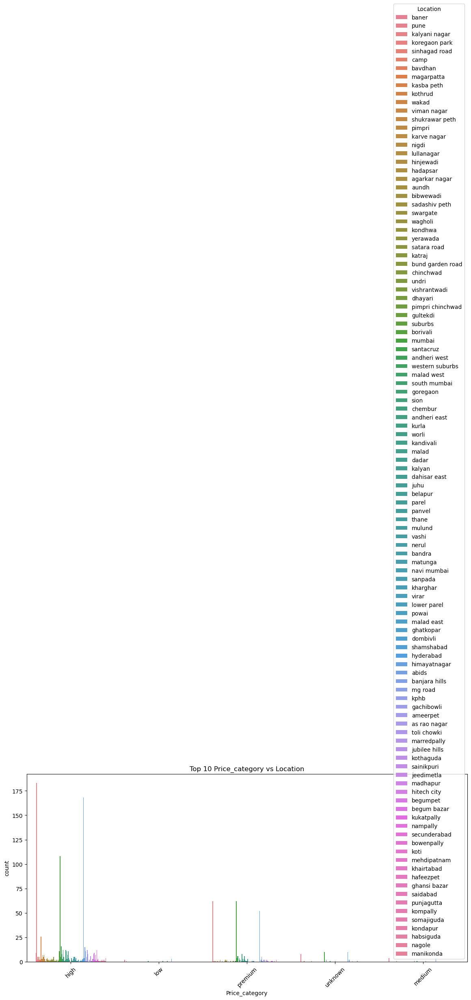

In [86]:
# Filter top 10 Price_category vs Location
price = df['Price_category'].value_counts().head(10).index
df_price = df[df['Price_category'].isin(price)]

plt.figure(figsize=(14,6))
sns.countplot(x='Price_category', hue='Location', data=df_price)
plt.title("Top 10 Price_category vs Location")
plt.xticks(rotation=45)
plt.show()


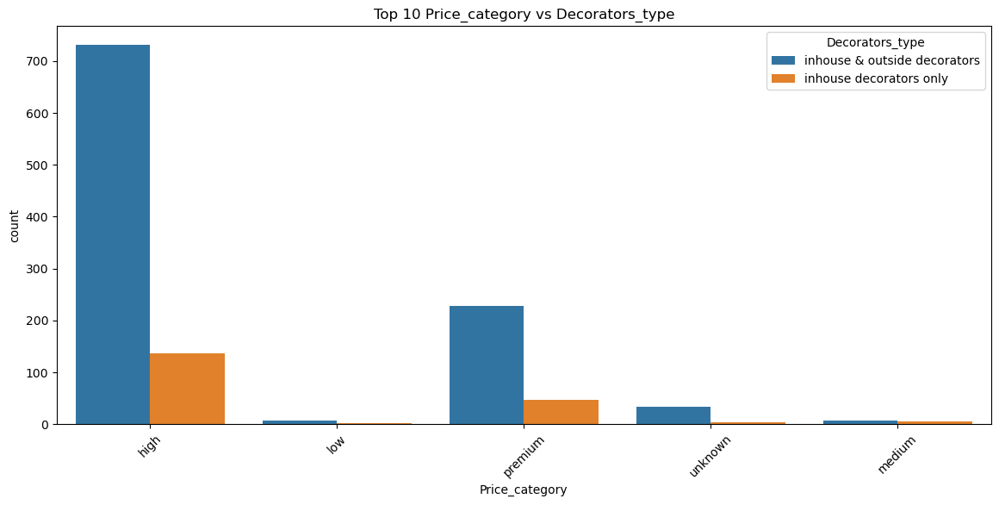

In [87]:
# Filter top 10 Price_category vs Decorators_type
price = df['Price_category'].value_counts().head(10).index
df_price = df[df['Price_category'].isin(price)]

plt.figure(figsize=(14,6))
sns.countplot(x='Price_category', hue='Decorators_type', data=df_price)
plt.title("Top 10 Price_category vs Decorators_type")
plt.xticks(rotation=45)
plt.show()


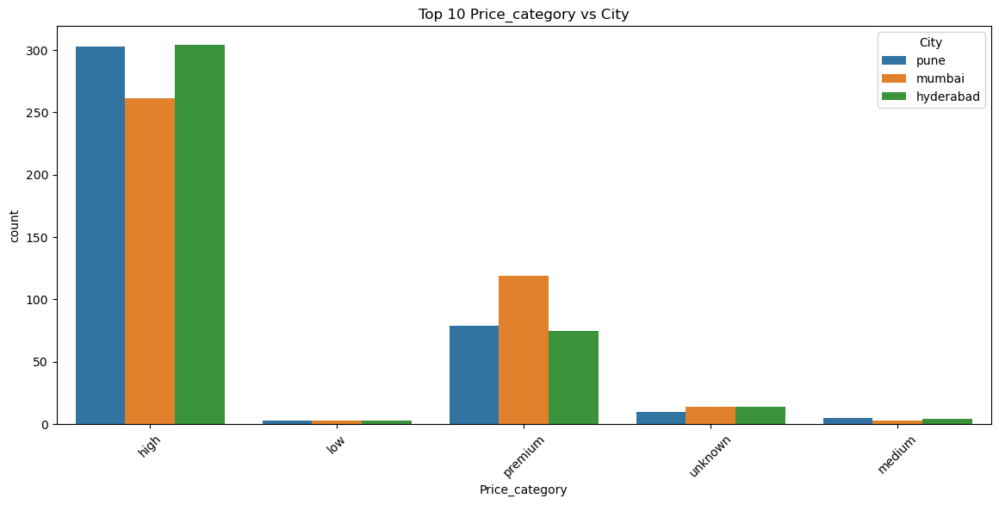

In [88]:
# Filter top 10 Price_category vs City
price = df['Price_category'].value_counts().head(10).index
df_price = df[df['Price_category'].isin(price)]

plt.figure(figsize=(14,6))
sns.countplot(x='Price_category', hue='City', data=df_price)
plt.title("Top 10 Price_category vs City")
plt.xticks(rotation=45)
plt.show()


# Cat vs Num

In [127]:
# Cat vs Num

print(num_df.columns)
print('-'*60)
print(cat_df.columns)

Index(['Price_onwards', 'Ratings', 'Review_counts'], dtype='object')
------------------------------------------------------------
Index(['Name', 'Location', 'Decorators_type', 'City', 'Price_category'], dtype='object')


# Name vs Numerical columns

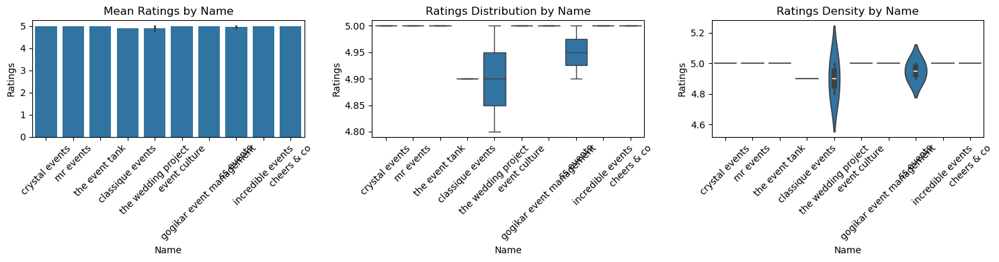

In [96]:
# Name vs Ratings

import matplotlib.pyplot as plt
import seaborn as sns

top10_names = df['Name'].value_counts().head(10).index
df_top = df[df['Name'].isin(top10_names)]

fig, axes = plt.subplots(1, 3, figsize=(15,4))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Name', y='Ratings', data=df_top, ax=axes[0])
axes[0].set_title("Mean Ratings by Name")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Name', y='Ratings', data=df_top, ax=axes[1])
axes[1].set_title("Ratings Distribution by Name")
axes[1].tick_params(axis='x', rotation=45)

# 3. Violin Plot (Shows density + distribution)
sns.violinplot(x='Name', y='Ratings', data=df_top, ax=axes[2])
axes[2].set_title("Ratings Density by Name")
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


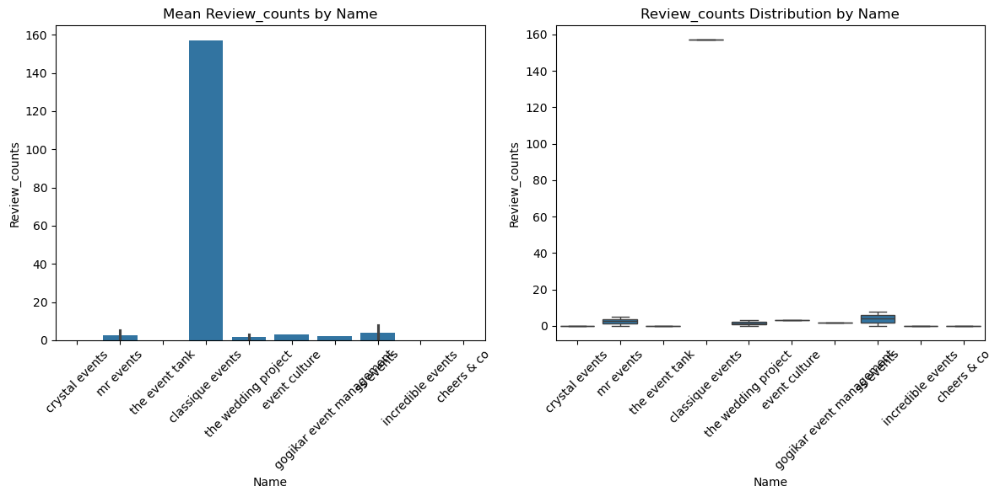

In [102]:
# Name vs Review_counts

top10_names = df['Name'].value_counts().head(10).index
df_top = df[df['Name'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Name', y='Review_counts', data=df_top, ax=axes[0])
axes[0].set_title("Mean Review_counts by Name")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Name', y='Review_counts', data=df_top, ax=axes[1])
axes[1].set_title("Review_counts Distribution by Name")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


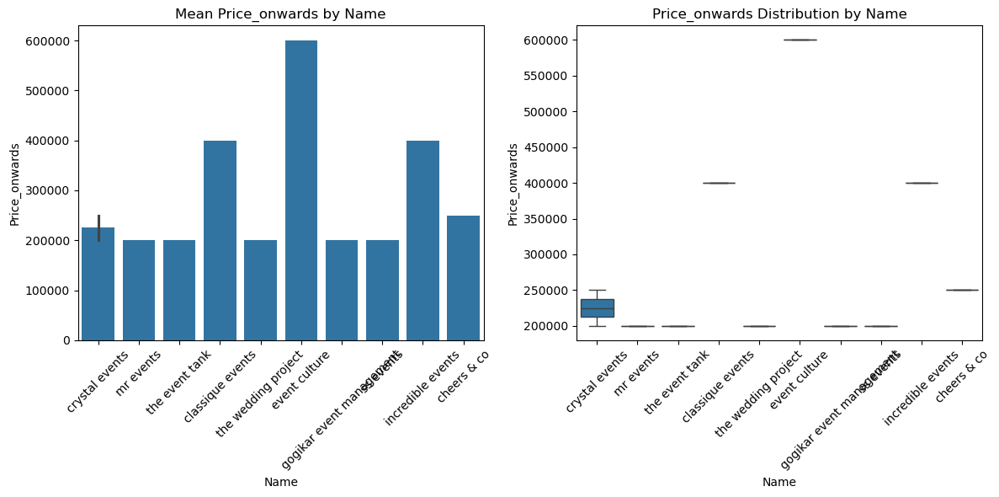

In [103]:
# Name vs Price_onwards

top10_names = df['Name'].value_counts().head(10).index
df_top = df[df['Name'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Name', y='Price_onwards', data=df_top, ax=axes[0])
axes[0].set_title("Mean Price_onwards by Name")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Name', y='Price_onwards', data=df_top, ax=axes[1])
axes[1].set_title("Price_onwards Distribution by Name")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


# Location vs Numerical Columns

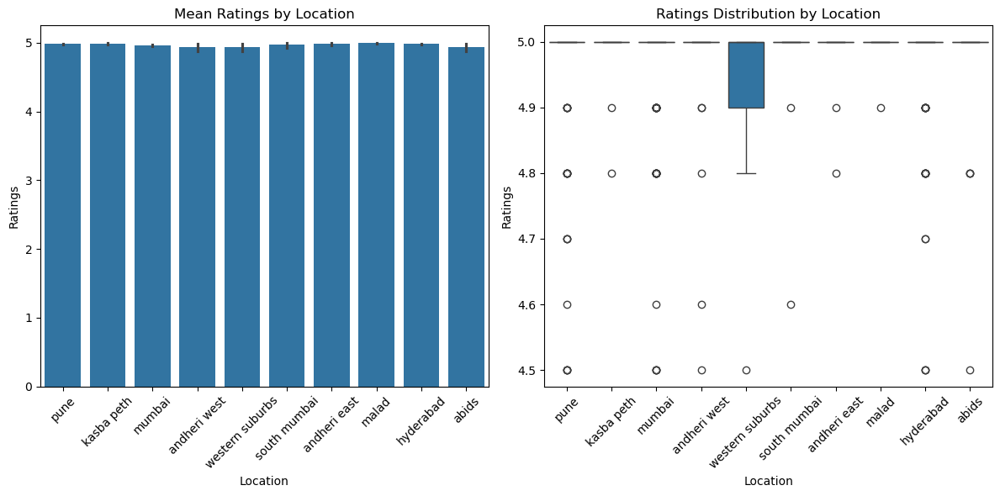

In [105]:
# Location vs RAtings

top10_names = df['Location'].value_counts().head(10).index
df_top = df[df['Location'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Location', y='Ratings', data=df_top, ax=axes[0])
axes[0].set_title("Mean Ratings by Location")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Location', y='Ratings', data=df_top, ax=axes[1])
axes[1].set_title("Ratings Distribution by Location")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


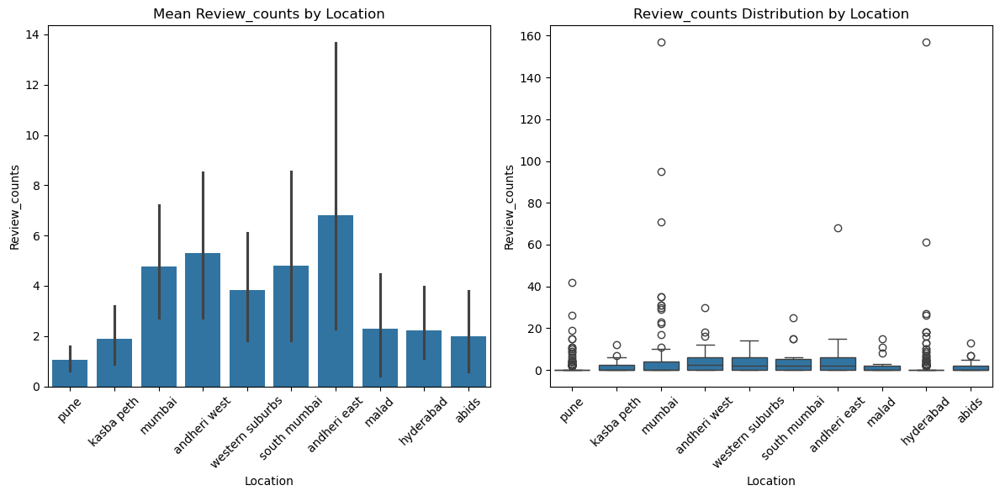

In [106]:
# Location vs Review_counts

top10_names = df['Location'].value_counts().head(10).index
df_top = df[df['Location'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Location', y='Review_counts', data=df_top, ax=axes[0])
axes[0].set_title("Mean Review_counts by Location")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Location', y='Review_counts', data=df_top, ax=axes[1])
axes[1].set_title("Review_counts Distribution by Location")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

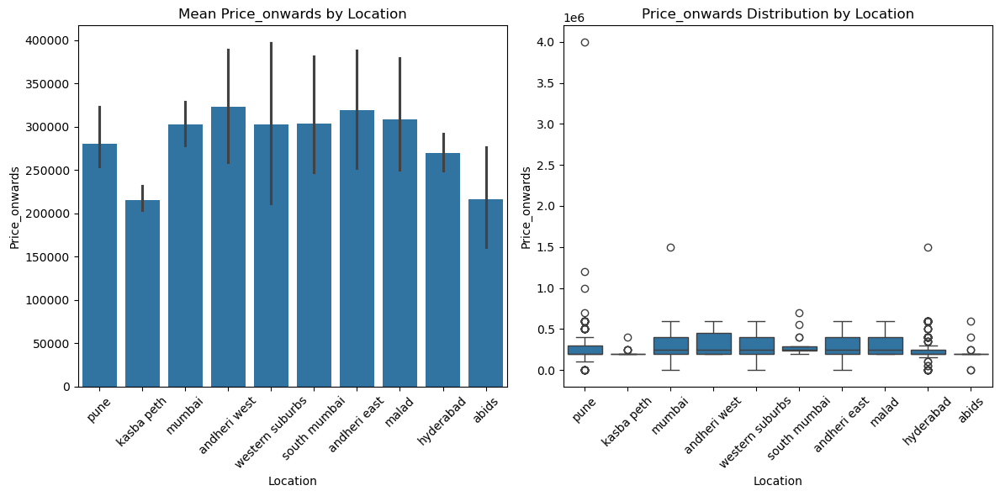

In [107]:
# Location vs Price_onwards

top10_names = df['Location'].value_counts().head(10).index
df_top = df[df['Location'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Location', y='Price_onwards', data=df_top, ax=axes[0])
axes[0].set_title("Mean Price_onwards by Location")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Location', y='Price_onwards', data=df_top, ax=axes[1])
axes[1].set_title("Price_onwards Distribution by Location")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

# Decorators_type vs Num col

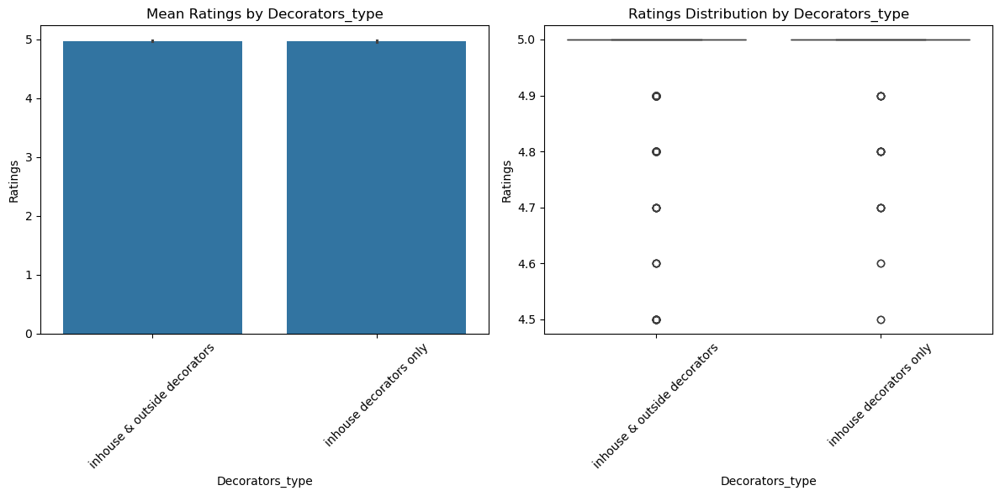

In [108]:
# Decorators_type vs RAtings

top10_names = df['Decorators_type'].value_counts().head(10).index
df_top = df[df['Decorators_type'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Decorators_type', y='Ratings', data=df_top, ax=axes[0])
axes[0].set_title("Mean Ratings by Decorators_type")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Decorators_type', y='Ratings', data=df_top, ax=axes[1])
axes[1].set_title("Ratings Distribution by Decorators_type")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


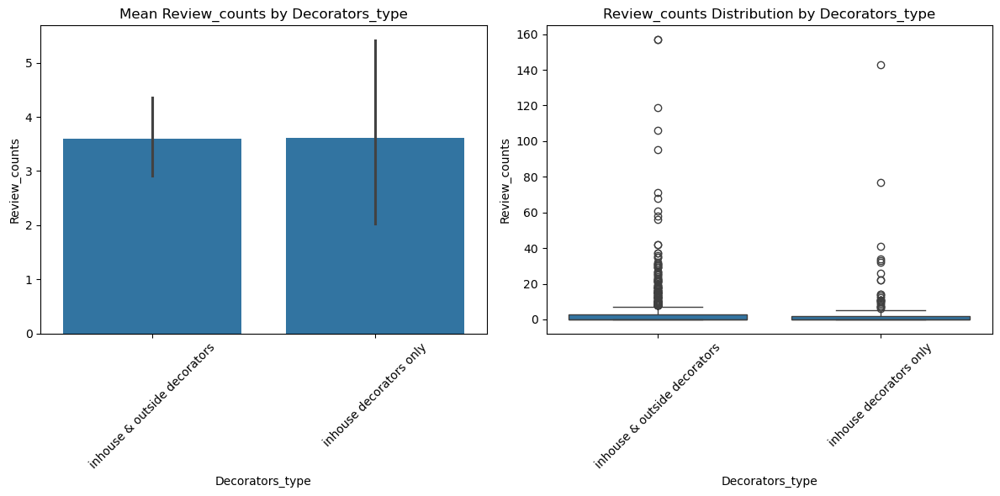

In [111]:
# Decorators_type vs Reveiw_count

top10_names = df['Decorators_type'].value_counts().head(10).index
df_top = df[df['Decorators_type'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Decorators_type', y='Review_counts', data=df_top, ax=axes[0])
axes[0].set_title("Mean Review_counts by Decorators_type")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Decorators_type', y='Review_counts', data=df_top, ax=axes[1])
axes[1].set_title("Review_counts Distribution by Decorators_type")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


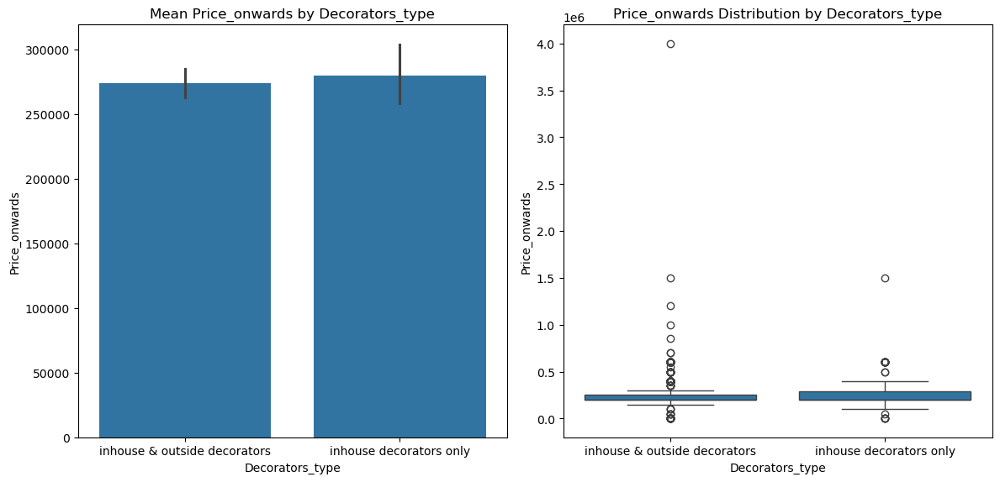

In [128]:
# Decorators_type vs Price_onwards

top10_names = df['Decorators_type'].value_counts().head(10).index
df_top = df[df['Decorators_type'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Decorators_type', y='Price_onwards', data=df_top, ax=axes[0])
axes[0].set_title("Mean Price_onwards by Decorators_type")
# axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Decorators_type', y='Price_onwards', data=df_top, ax=axes[1])
axes[1].set_title("Price_onwards Distribution by Decorators_type")
# axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


# City vs Num col

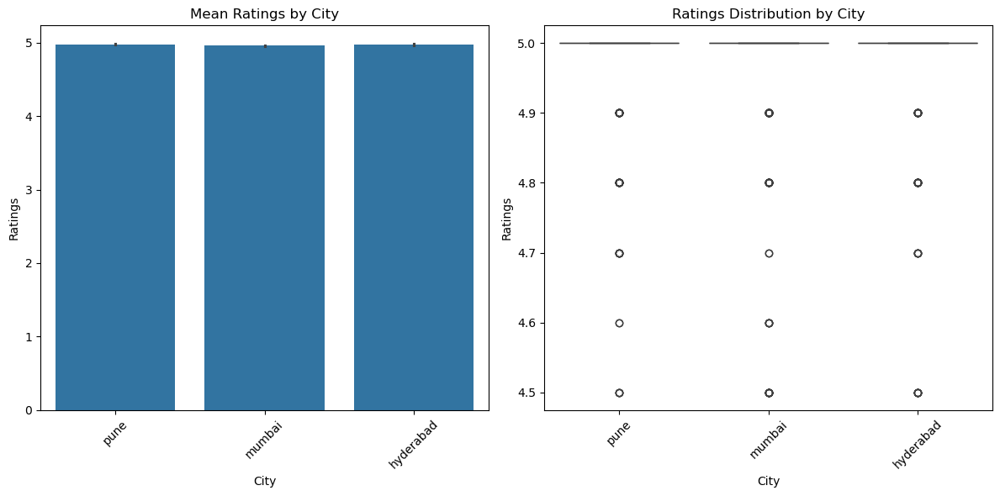

In [113]:
# City vs Ratings

top10_names = df['City'].value_counts().head(10).index
df_top = df[df['City'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='City', y='Ratings', data=df_top, ax=axes[0])
axes[0].set_title("Mean Ratings by City")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='City', y='Ratings', data=df_top, ax=axes[1])
axes[1].set_title("Ratings Distribution by City")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


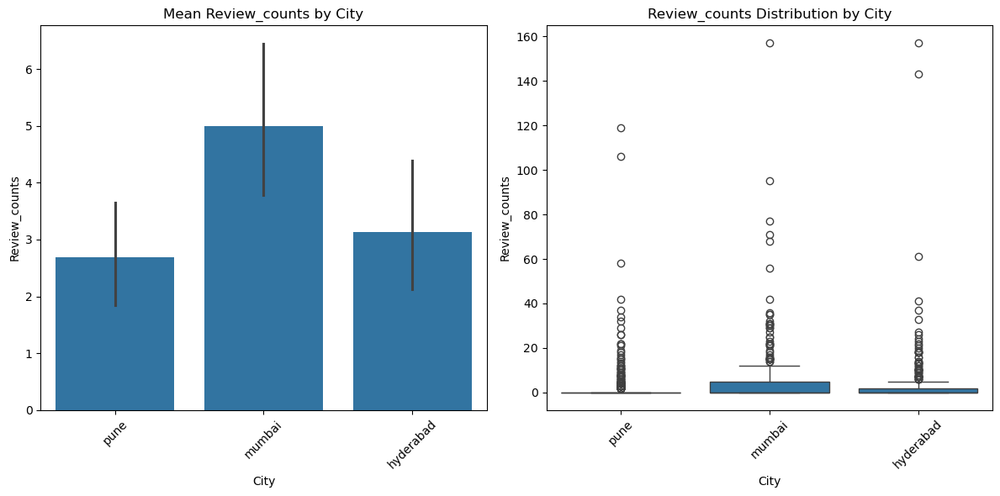

In [114]:
# City vs Review_counts

top10_names = df['City'].value_counts().head(10).index
df_top = df[df['City'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='City', y='Review_counts', data=df_top, ax=axes[0])
axes[0].set_title("Mean Review_counts by City")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='City', y='Review_counts', data=df_top, ax=axes[1])
axes[1].set_title("Review_counts Distribution by City")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


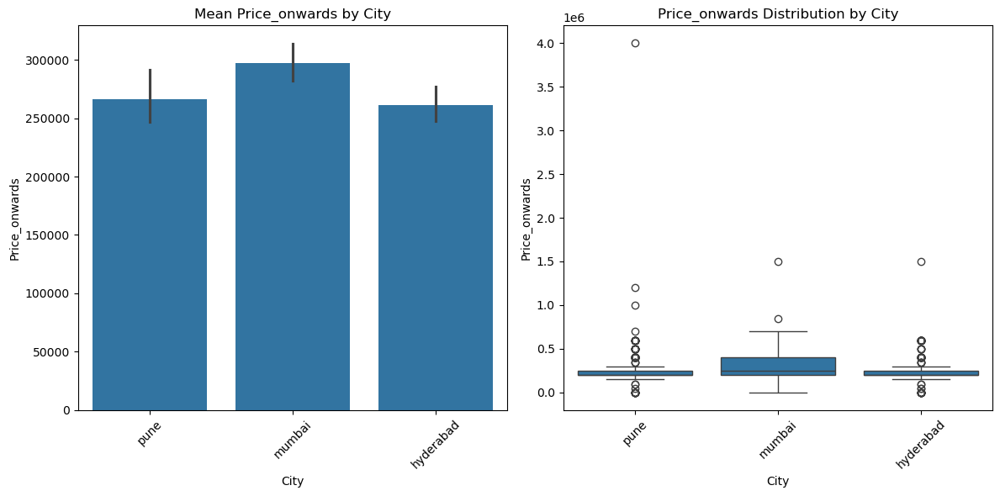

In [115]:
# City vs Price_onwards

top10_names = df['City'].value_counts().head(10).index
df_top = df[df['City'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='City', y='Price_onwards', data=df_top, ax=axes[0])
axes[0].set_title("Mean Price_onwards by City")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='City', y='Price_onwards', data=df_top, ax=axes[1])
axes[1].set_title("Price_onwards Distribution by City")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


# Price_category vs Num col

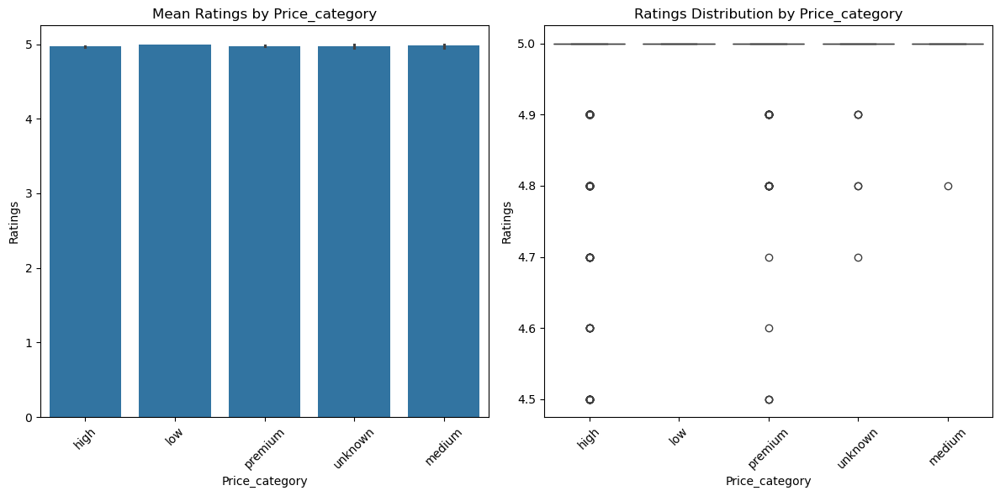

In [116]:
# Price_category vs Ratings

top10_names = df['Price_category'].value_counts().head(10).index
df_top = df[df['Price_category'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Price_category', y='Ratings', data=df_top, ax=axes[0])
axes[0].set_title("Mean Ratings by Price_category")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Price_category', y='Ratings', data=df_top, ax=axes[1])
axes[1].set_title("Ratings Distribution by Price_category")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


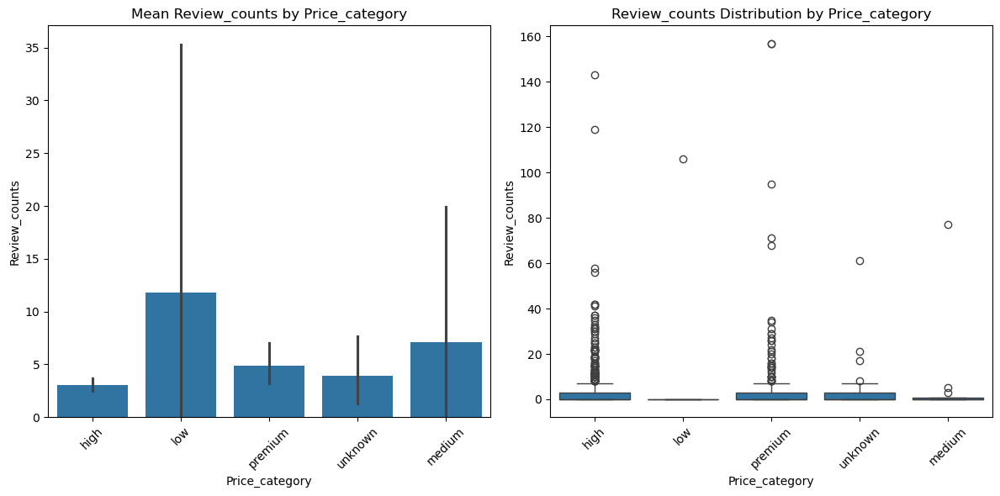

In [117]:
# Price_category vs Review_counts

top10_names = df['Price_category'].value_counts().head(10).index
df_top = df[df['Price_category'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Price_category', y='Review_counts', data=df_top, ax=axes[0])
axes[0].set_title("Mean Review_counts by Price_category")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Price_category', y='Review_counts', data=df_top, ax=axes[1])
axes[1].set_title("Review_counts Distribution by Price_category")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()


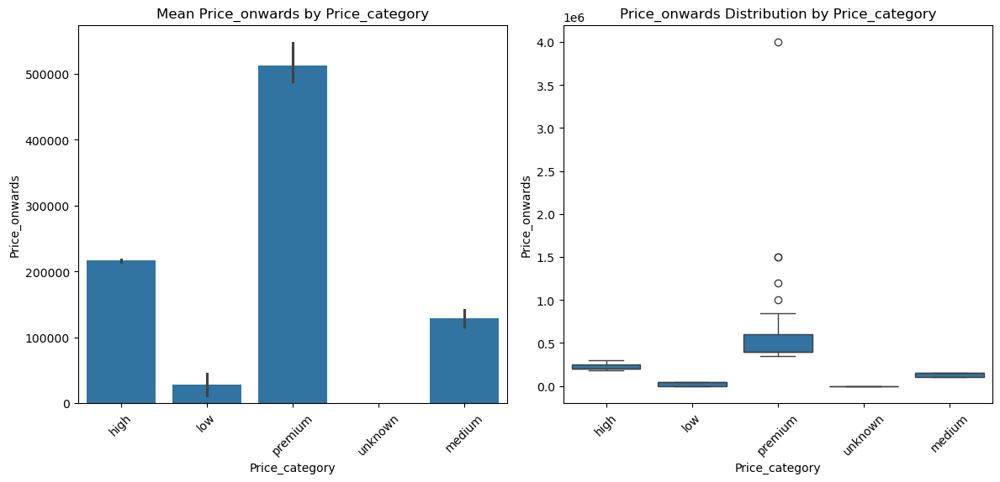

In [118]:
# Price_category vs Price_onwards

top10_names = df['Price_category'].value_counts().head(10).index
df_top = df[df['Price_category'].isin(top10_names)]

fig, axes = plt.subplots(1,2, figsize=(12,6))

# 1. Barplot (Mean Ratings for each Name)
sns.barplot(x='Price_category', y='Price_onwards', data=df_top, ax=axes[0])
axes[0].set_title("Mean Price_onwards by Price_category")
axes[0].tick_params(axis='x', rotation=45)

# 2. Boxplot (Ratings distribution per Name)
sns.boxplot(x='Price_category', y='Price_onwards', data=df_top, ax=axes[1])
axes[1].set_title("Price_onwards Distribution by Price_category")
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()
